In [62]:
%load_ext autoreload
%autoreload 2
from pathlib import Path
import pandas as pd
from mrich import print
import mrich
import molparse as mp
import hippo
import plotly.express as px
from hippo.plotting import plot_compound_tsnee

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [34]:
animal = hippo.HIPPO("RdRp_FFF", "../../BulkDock/TARGETS/Flavi_NS5_RdRp/Flavi_NS5_RdRp.sqlite")

 Creating HIPPO animal

name = RdRp_FFF

db_path = ../../BulkDock/TARGETS/Flavi_NS5_RdRp/Flavi_NS5_RdRp.sqlite

DEBUG: hippo.Database.__init__()

DEBUG: Database.path = ../../BulkDock/TARGETS/Flavi_NS5_RdRp/Flavi_NS5_RdRp.sqlite

DEBUG: hippo.Database.connect()

DEBUG: sqlite3.version='2.6.0'

 Success  Database connected @ ../../BulkDock/TARGETS/Flavi_NS5_RdRp/Flavi_NS5_RdRp.sqlite!

 Success  Initialised animal HIPPO("RdRp_FFF")!

## Check CSVs

In [9]:
elab_dir = Path("../syndirella/elabs")

In [10]:
dfs = []
for file in elab_dir.glob("*/*output*.csv"):
    df = pd.read_csv(file)
    dfs.append(df)

In [11]:
df = pd.concat(dfs)
df.head()

,smiles,inchi_key,error_type,error_message,1_r1_smiles,1_r2_smiles,1_reaction,compound_set,hit1,hit2,num_placed,num_successful,route_uuid,template,to_hippo,total_num_products_enumstereo,total_num_unique_products,hit3
0,O=C(OCCN1CCCc2ccccc21)c1ncsc1Br,SGOQIRYDERXCCT-UHFFFAOYSA-N,NaN,NaN,OCCN1CCCc2ccccc21,O=C(O)c1ncsc1Br,Steglich_esterification,P144594,z0165a,z0628a,109.0,58.0,pwprhU,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,109.0,99.0,NaN
0,CC(O)CNC(=O)Nc1cccc2cc[nH]c12,XYRDJRCBUAYREB-UHFFFAOYSA-N,NaN,NaN,NC(=O)Nc1cccc2cc[nH]c12,CC1CO1,Epoxide_+_amine_coupling,P132071,z0041a,z0211a,1360.0,549.0,6gzCLT,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,1360.0,560.0,NaN
0,CC(O)CNC(=O)Nc1cccc2cc[nH]c12,XYRDJRCBUAYREB-UHFFFAOYSA-N,NaN,NaN,NC(=O)Nc1cccc2cc[nH]c12,CC1CO1,Epoxide_+_amine_coupling,P205083,z0041a,z0211a,1748.0,688.0,b2aLUL,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,1748.0,692.0,NaN
0,Nc1csc(-c2nccc3ccccc23)n1,BXXSTDNXQYXVHZ-UHFFFAOYSA-N,NaN,NaN,Nc1csc(Br)n1,CC1(C)OB(c2nccc3ccccc23)OC1(C)C,Sp2-sp2_Suzuki_coupling,P95957,z0111a,z0496a,144.0,67.0,VSw54J,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,144.0,121.0,NaN
0,Brc1ccnc2c(NCc3ccncc3)cccc12,ZFGFQBONQPPJMM-UHFFFAOYSA-N,NaN,NaN,OCc1ccncc1,Nc1cccc2c(Br)ccnc12,Mitsunobu_reaction_with_amine_alcohol_and_thio...,P96212,z0221a,z1040a,837.0,818.0,VBjCFn,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,837.0,635.0,NaN


In [12]:
df[df["compound_set"] == "P35422"]

,smiles,inchi_key,error_type,error_message,1_r1_smiles,1_r2_smiles,1_reaction,compound_set,hit1,hit2,num_placed,num_successful,route_uuid,template,to_hippo,total_num_products_enumstereo,total_num_unique_products,hit3
0,CCS(=O)(=O)NCc1ccc(OCc2ccccn2)cc1,ZPBHINXHGPMFIS-UHFFFAOYSA-N,ValueError,ChemicalParserException: initMatchers() must b...,NCc1ccc(OCc2ccccn2)cc1,CCS(=O)(=O)F,Sulfonamide_Schotten-Baumann_with_amine_(inter...,P35422,d0174a,d0279a,NaN,NaN,6LpP54,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,NaN,NaN,NaN,NaN
1,CCS(=O)(=O)NCc1ccc(OCc2ccccn2)cc1,ZPBHINXHGPMFIS-UHFFFAOYSA-N,ProductFormationError,All products filtered for step 1.,C.O[CH:1]=[O:2],NCc1ccc(OCc2ccccn2)cc1,Amidation,P35422,d0174a,d0279a,NaN,NaN,3KBqjq,/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndir...,NaN,NaN,NaN,NaN


In [21]:
for x in set([tuple(a) for a in df[["compound_set", "error_type", "error_message"]][~df["error_type"].isna()][["error_type", "error_message"]].values]):
    print(x)

(
    'NoScaffold',
    'Scaffold was not found in the scaffold names of the HIPPO output at 
/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndirella/elabs/P220494_elabs/ZPOQGHRFNABCTB-UHFFFAOYSA-O/ZPOQGHRFNABCTB-U
HFFFAOYSA-O_ZuwEfw_to_hippo.pkl.gz.Most likely due to an incorrectly written SMIRKS.'
)

(
    'NoScaffold',
    'Scaffold was not found in the scaffold names of the HIPPO output at 
/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndirella/elabs/P185725_elabs/UCXOUSGPQWXLPI-UHFFFAOYSA-N/UCXOUSGPQWXLPI-U
HFFFAOYSA-N_sXHCwE_to_hippo.pkl.gz.Most likely due to an incorrectly written SMIRKS.'
)

(
    'NoScaffold',
    'Scaffold was not found in the scaffold names of the HIPPO output at 
/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndirella/elabs/P220497_elabs/HKSKQIDUPLNFRX-UHFFFAOYSA-O/HKSKQIDUPLNFRX-U
HFFFAOYSA-O_ZUTXzx_to_hippo.pkl.gz.Most likely due to an incorrectly written SMIRKS.'
)

(
    'NoScaffold',
    'Scaffold was not found in the scaffold names of the HIPPO output at 
/opt/xchem-fragalysis-2/maxwin/RdRp_FFF/syndirella/elabs/P220483_elabs/XBGYNXCWRGTMRQ-UHFFFAOYSA-O/XBGYNXCWRGTMRQ-U
HFFFAOYSA-O_QXCRNi_to_hippo.pkl.gz.Most likely due to an incorrectly written SMIRKS.'
)

('ProductFormationError', 'All products filtered for step 1.')

('ValueError', 'ChemicalParserException: initMatchers() must be called before runReactants()')

## Try loading some elabs

In [7]:
file = "../syndirella/elabs/P144594_elabs/SGOQIRYDERXCCT-UHFFFAOYSA-N/SGOQIRYDERXCCT-UHFFFAOYSA-N_pwprhU_to_hippo.pkl.gz"
animal.add_syndirella_elabs(file, tags = ["iter1"], check_chemistry=False)

Output()

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /opt/xchem-fragalysis-2/maxwin/conda/envs/py312/lib/python3.12/site-packages/hippo/animal.py:104 │
│ 7 in add_syndirella_elabs                                                                        │
│                                                                                                  │
│   1044 │   │   │   │   │   │   │   match inspiration_map:                                        │
│   1045 │   │   │   │   │   │   │   │   case dict():                                              │
│   1046 │   │   │   │   │   │   │   │   │   try:                                                  │
│ ❱ 1047 │   │   │   │   │   │   │   │   │   │   inspiration = inspiration_map[inspiration]        │
│   1048 │   │   │   │   │   │   │   │   │                                                         │
│   1049 │   │   │   │   │   │   │   │   │   except KeyError:                                      │
│   1050                                                                                           │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │     allow_missing_inspirations = False                                                       │ │
│ │                           base = None                                                        │ │
│ │                base_designator = 'scaffold'                                                  │ │
│ │                        base_df = │   │   │   │      scaffold_smiles               1_reaction │ │
│ │                                  1_r1_smiles  \                                              │ │
│ │                                  0  O=C(OCCN1CCCc2ccccc21)c1ncsc1Br  Steglich_esterification │ │
│ │                                  O=C(O)c1ncsc1Br                                             │ │
│ │                                  │   │                                                       │ │
│ │                                  │   │    1_r2_smiles 1_r_previous_product                   │ │
│ │                                  1_product_smiles  \                                         │ │
│ │                                  0  OCCN1CCCc2ccccc21                 None                   │ │
│ │                                  O=C(OCCN1CCCc2ccccc21)c1ncsc1Br                             │ │
│ │                                  │   │   │   │   │   │   │   │                               │ │
│ │                                  │   │   │   │   │   │   │   │     1_product_name 1_flag     │ │
│ │                                  1_num_atom_diff  \                                          │ │
│ │                                  0  SGOQIRYDERXCCT-UHFFFAOYSA-N-pwprhU-scaffold-A   None     │ │
│ │                                  0                                                           │ │
│ │                                                                                              │ │
│ │                                    1_stereoisomer error      ∆∆G    ∆G_bound  ∆G_unbound     │ │
│ │                                  comRMSD  \                                                  │ │
│ │                                  0              A       -75.0354  250.115926  325.151327     │ │
│ │                                  0.985208                                                    │ │
│ │                                  │   │                                                       │ │
│ │                                  │   │      regarded                                         │ │
│ │                                  path_to_mol  \                                              │ │
│ │                                  0  [z0165a, z0628a]                                         │ │
│ │                                  /opt/xchem-fragalysis-2/

In [35]:
animal.compounds(tag="iter1")
animal.poses(tag="iter1")

poses tagged "iter1": {P × 55471}

In [44]:
scaffold_compounds = animal.poses(tag="iter1 scaffolds").compounds

In [66]:
data = []
for c in scaffold_compounds:
    elabs = c.elabs
    # print(c, elabs)
    if not elabs:
        elabs = []
    data.append(dict(scaffold=str(c), num_elabs=len(elabs)))
    # print(c, elabs, elabs.poses)
    # break
df = pd.DataFrame(data)

In [69]:
print(len(df[df["num_elabs"] > 0]))
print(len(df[df["num_elabs"] == 0]))

18

214

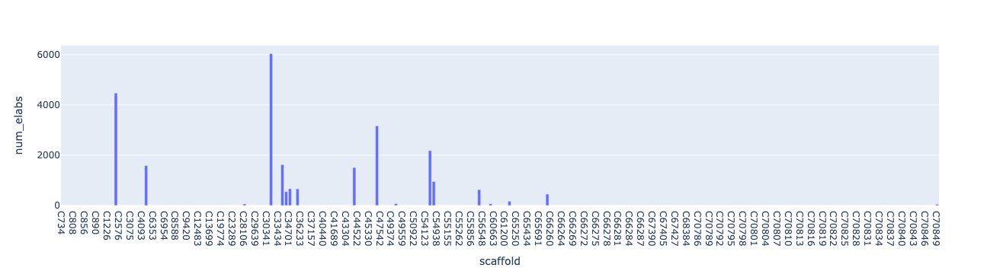

In [65]:
px.bar(data, x="scaffold", y="num_elabs")

Output()

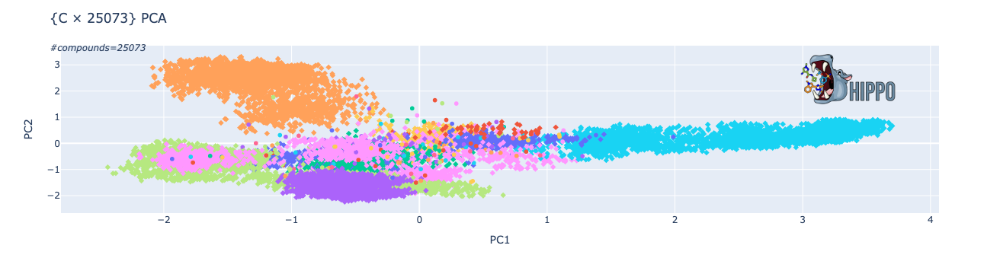

In [53]:
cset = scaffold_compounds + scaffold_compounds.elabs
fig = plot_compound_tsnee(cset)
fig

In [56]:
mp.write("elab_tsnee.html", fig)

 DISK  Writing elab_tsnee.html...

In [58]:
mp.write("elab_tsnee.pdf", fig)

 DISK  Writing elab_tsnee.pdf...